<a href="https://colab.research.google.com/github/bnv20/cakd3/blob/main/dl_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

객체 탐지
- 한 이미지에서 객체와 그 경계 상자를 탐지
- 객체 탐지 알고리즘은 일반적으로 이미지를 입력으로 받고 경계 상자와 객체
클래스 리스트를 출력
- 경계 상자에 대해 그에 대응하는 예측 클래스와 클래스의 신뢰도를 출력

Applications
- 자율 주행 자동차에서 다른 자동차와 보행자를 찾을 때
- 의료 분야에서 방사선 사진을 사용해 종양이나 위험한 조직을 찾을 때
- 제조업에서 조립 로봇이 제품을 조립하거나 수리할 때
- 보안 산업에서 위협을 탐지하거나 사람 수를 셀 때

Bounding Box
- 이미지에서 하나의 객체 전체를 포함하는 가장 작은 직사각형

IOU(Intersection Over Union)
- 실측값(Ground Truth) 과 모델이 예측한 값이 얼마나 겹치는지를 나타내는 지표
IOU = Area of Overlap / Area of Union  
IOU가 높을수록 잘 예측한 모델

NMS(Non-Maximum Suppression, 비최댓값 억제)
- 확률이 가장 높은 상자와 겹치는 상자들을 제거하는 과정
- 최댓값을 갖지 않는 상자들을 제거 과정
 - 확률 기준으로 모든 상자를 정렬하고 먼저 가장 확률이 높은 상자를 취함
 - 각 상자에 대해 다른 모든 상자와의 IOU를 계산
 - 특정 임곗값을 넘는 상자는 제거

AP(Average Precision, 평균 정밀도) 와 mAP(mean Average Precision)
- 곡선의 아래 영역에 해당
- 항상 1x1 정사각형으로 구성되어 있음
  즉, 항상 0 ~ 1 사이의 값을 가짐
- 단일 클래스에 대한 모델 성능 정보를 제공
- 전역 점수를 얻기 위해서 mAP를 사용
- 예를 들어 데이터셋이 10개의 클래스로 구성된다면 각 클래스에 대한 AP를 계산하고 그 숫자들의 평균을 다시 구함
- mAP 사용
 - 최소 2개 이상의 객체를 탐지하는 대회인 PASCAL Visual Object Classes와 Common Objects in Context(COCO)에서 mAP가 사용됨
 - COCO 데이터셋이 더 많은 클래스를 포함하고 있기 때문에 보통 Pascal VOC보다 점수가 더 낮게 나옴

COCO Dataset
- Common Objects in Context
- 200000개의 이미지
- 80개의 카테고리에 500000개 이상의 객체 Annotation이 존재

https://cocodataset.org/

RCNN(2013) : Regional Proposal 방식 제안

SPP Net(2014) : 실행 시간 단축

Fast RCNN(2015) : SPP보다 간단하고 RCNN에 비해 수행시간을 줄임

Faster RCNN(2015) : Anchor Box 개념 사용

SSD(2015) : real-time으로 사용할 정도의 성능을 갖춤(30~40 fps)

RetinaNet(2017)

Mask R-CNN(2018)

YOLO(2018) : https://www.youtube.com/watch?v=vRqSO6RsptU
- YOLOv3: An Incremental Improvement(https://arxiv.org/abs/1804.02767)
- YOLO는 v1,v2,v3의 순서로 발전하였는데 v1은 정확도가 너무 낮은 문제가 있었고 이 문제는 v2까지 이어짐
- 엔지니어링적으로 보완한 v3는 v2보다 살짝 속도는 떨어지더라도 정확도를 대폭 높인 모델
- RetinaNet과 마찬가지로 FPN을 도입해 정확도를 높임
- RetinaNet에 비하면 정확도는 4mAP 정도 떨어지지만 속도는 더 빠르다는 장점
- YOLO v3 논문 : https://herbwood.tistory.com/21

RefineDet(2018)

M2Det(2019)

EfficientDet(2019)

YOLOv4(2020)
- YOLOv3에 비해 AP,FPS가 각각 10%,12% 증가
- YOLOv3와 다른 개발자인 AlexeyBochkousky가 발표
- v3에서 다양한 딥러닝 기법등을 사용해 성능을 향상시킴
- CSPNet 기반의 backbone(CSPKarkNet53)을 설계하여 사용

YOLOv5(2020)
- YOLOv4에 비해 낮은 용량과 빠른 속도(성능은 비슷)
- YOLOv4와 같은 CSPNet 기반의 backbone을 설계하여 사용
- YOLOv3를 PyTorch로 implementation한 GlennJocher가 발표
- Darknet이 아닌 PyTorch 구현이기 때문에 이전 버전들과 다르다고 할 수 있음


YOLO(You Only Look Once)
- 가장 빠른 객체 검출 알고리즘 중 하나
- 256x256 사이즈의 이미지
- 파이썬, 텐서플로 기반 프레임워크가 아닌 C++로 구현된 코드 기준 GPU 사용 시, 초당 170 프레임(170 FPS, frames per second)
- 작은 크기의 물체를 탐지하는데는 어려움

https://pjreddie.com/darknet/yolo/

YOLO 계층 출력
- 마지막 계층 출력은 w x h x M 행렬
  - M = B x (C + 5)
    - B : 그리드 셀당 경계 상자 개수
    - C : 클래스 개수
  - 클래스 개수에 5를 더한 이유는 해당 값 만큼의 숫자를 예측해야 함
    - tx, ty는 중심 좌표
    - tw, th는 너비와 높이
    - c는 신뢰도
    - p1,p2,...pC는 클래스 1,2,..C의 객체를 포함할 확률
    - Objectness Score : 바운딩 박스에 객체가 포함될 있을 확률

앵커 박스
- 사전 정의된 상자(prior box)
- 객체에 가장 근접한 앵커 박스를 맞추고 신경망을 사용해 앵커 박스의 크기를 조정하는 과정 때문에 tx,ty,tw,th이 필요
- https://kr.mathworks.com/help/vision/ug/getting-started-with-yolo-v2.html
- https://yeomko.tistory.com/19?category=888201

파이토치
- 딥러닝 프레임워크 파이토치
  - 파이토치란 데이터에 대한 딥러닝 분석을 쉽게 할 수 있도록 제공하는 오픈소스 기반 딥러닝 프레임워크이다.
  - Data Science 분야의 개발자로 프로그래밍을 하기 위해서 꼭 사용해야 하는 툴 중 하나가 딥러닝 프레임워크(Deep Learning Frameworks)인데 그중에 하나가 바로 파이토치(PyTorch)인 것이다.
  - 딥러닝 프레임워크를 툴로써 제공하기 때문에 개발자는 보다 손쉽게 프로그래밍을 할 수 있다.
  - 예를 들어 딥러닝 프레임워크는 요리사에게 재료 준비와 손질까지 된 환경을 제공해준다고 볼 수 있다.
  - 파이토치는 파이썬 기반으로 바로 사용할 수 있다는 점에서 개발 과정이 텐서플로우보다 심플하다.

- pytorch tutorials : https://tutorials.pytorch.kr/
- yolov3 pytorch 버전 : https://github.com/ultralytics/yolov3
- yolov5 : https://github.com/ultralytics/yolov5

In [1]:
import torch

print("Torch version:{}".format(torch.__version__))
print("cuda version: {}".format(torch.version.cuda))
print("cudnn version:{}".format(torch.backends.cudnn.version()))

Torch version:1.9.0+cu111
cuda version: 11.1
cudnn version:8005


COCO Dataset을 학습한 YOLO v3

In [2]:
!git clone https://github.com/ultralytics/yolov3
%cd yolov3/
%pip install -qr requirements.txt

import yaml
import torch
from IPython.display import Image, clear_output

print(f"Torch:{torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda. is_available() else 'CPU'})")

Cloning into 'yolov3'...
remote: Enumerating objects: 9961, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 9961 (delta 18), reused 63 (delta 14), pack-reused 9858
Receiving objects: 100% (9961/9961), 9.37 MiB | 23.99 MiB/s, done.
Resolving deltas: 100% (6682/6682), done.
/content/yolov3
     |████████████████████████████████| 596 kB 8.2 MB/s 
Torch:1.9.0+cu111 (Tesla P100-PCIE-16GB)


In [3]:
!ls

data	    hubconf.py	README.md	  train.py	  weights
detect.py   LICENSE	requirements.txt  tutorial.ipynb
Dockerfile  models	test.py		  utils


In [4]:
!ls data/images

bus.jpg  zidane.jpg


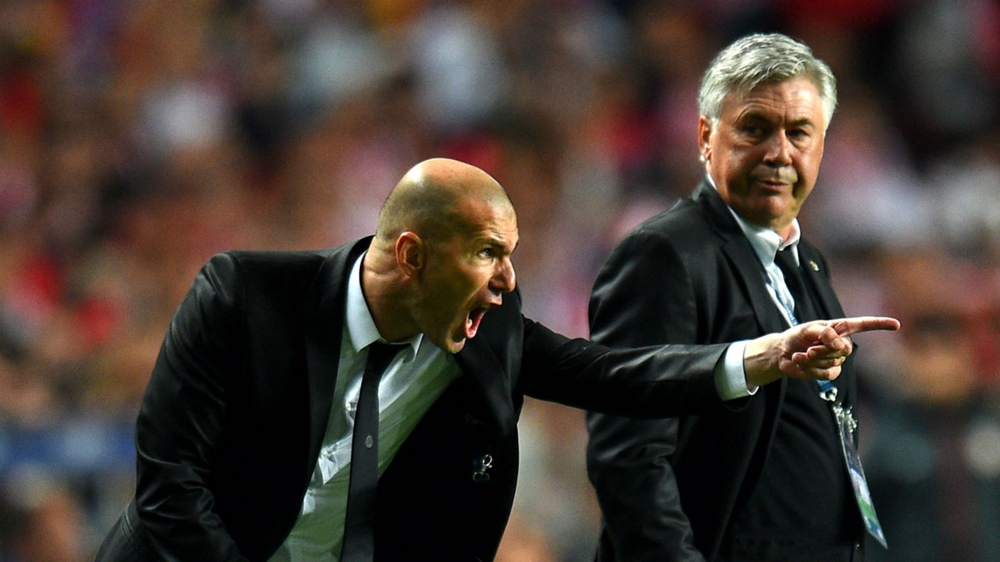

In [5]:
Image(filename='data/images/zidane.jpg',width=600)

In [6]:
!python detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/images/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='data/images/', update=False, view_img=False, weights=['yolov3.pt'])
YOLOv3 🚀 v9.5.0-13-g1be3170 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

100% 118M/118M [00:02<00:00, 60.3MB/s]

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/2 /content/yolov3/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.051s)
image 2/2 /content/yolov3/data/images/zidane.jpg: 384x640 2 persons, 3 ties, Done. (0.026s)
Results saved to runs/detect/exp
Done. (0.442s)


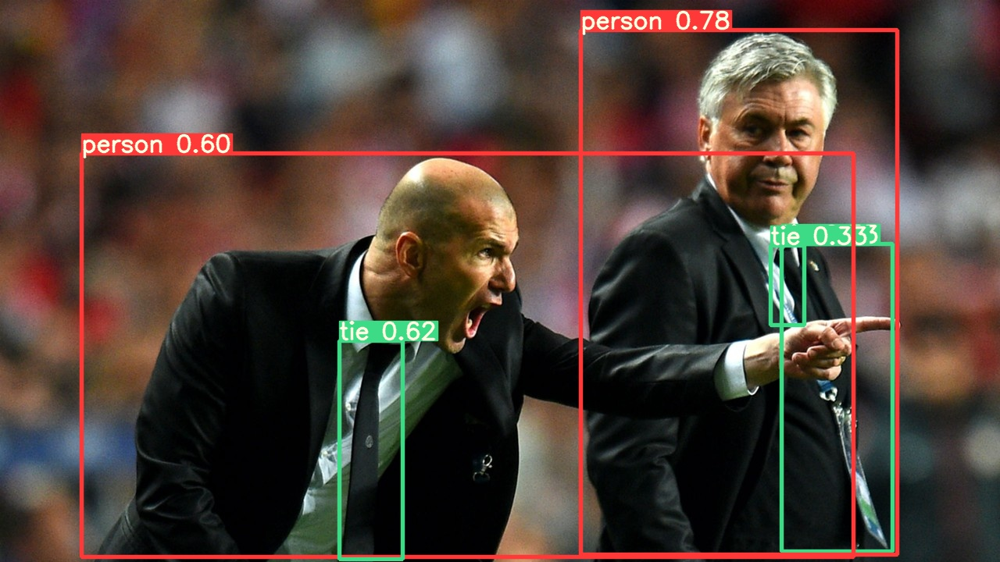

In [7]:
Image(filename='runs/detect/exp/zidane.jpg',width=600)

In [9]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 10129, done.
remote: Total 10129 (delta 0), reused 0 (delta 0), pack-reused 10129
Receiving objects: 100% (10129/10129), 10.27 MiB | 4.68 MiB/s, done.
Resolving deltas: 100% (7028/7028), done.
/content/yolov5


In [10]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/  #yolov5s small 버전


detect: weights=['yolov5s.pt'], source=data/images/, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

100% 14.0M/14.0M [00:00<00:00, 69.1MB/s]

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.012s)
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, Done. (0.011s)
Speed: 0.4ms pre-process, 11.6ms inference, 1.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


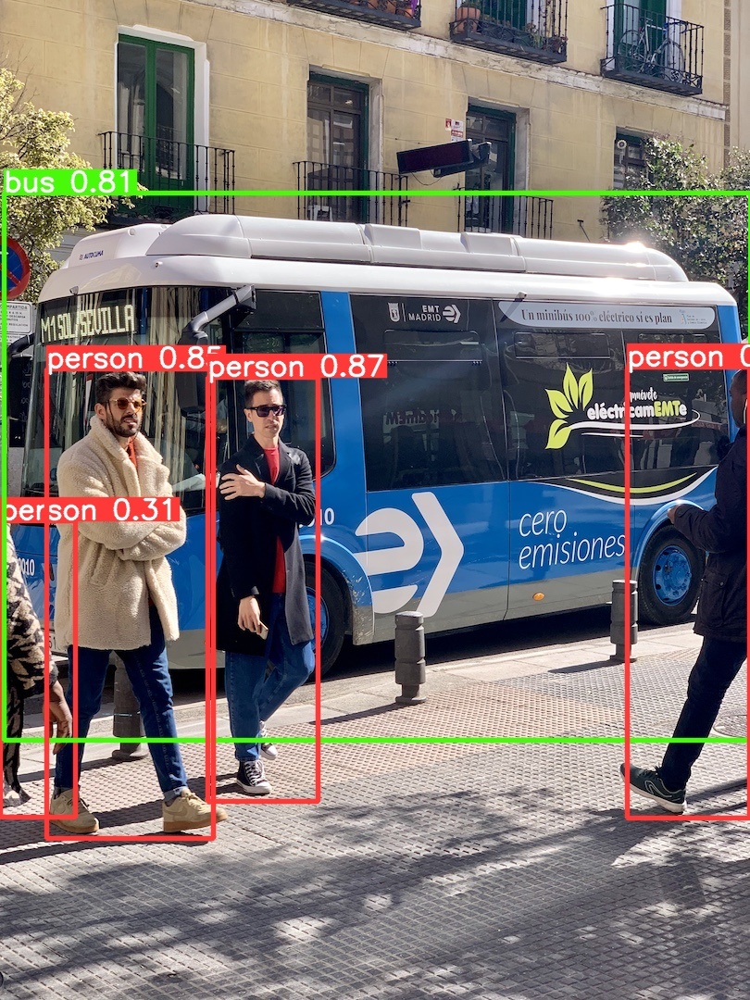

In [11]:
Image(filename='runs/detect/exp/bus.jpg',width=600)

데이터셋 다운로드
- 포트홀 데이터셋 : https://public.roboflow.com/object-detection/pothole
- url copy : https://public.roboflow.com/ds/bYJNNdPId2?key=WsonnjVSrC

In [12]:
%mkdir /content/yolov5/pothole
%cd /content/yolov5/pothole

/content/yolov5/pothole


In [13]:
!curl -L "https://public.roboflow.com/ds/bYJNNdPId2?key=WsonnjVSrC" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0    932      0 --:--:-- --:--:-- --:--:--   931
100 46.0M  100 46.0M    0     0  29.8M      0  0:00:01  0:00:01 --:--:-- 29.8M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img

In [14]:
!ls

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [15]:
from glob import glob

train_img_list = glob('/content/yolov5/pothole/train/images/*.jpg')
test_img_list= glob('/content/yolov5/pothole/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/pothole/valid/images/*.jpg')
print(len(train_img_list), len(test_img_list),len(valid_img_list))


465 67 133


In [16]:
import yaml

with open('/content/yolov5/pothole/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov5/pothole/test.txt', 'w') as f:
  f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov5/pothole/valid.txt', 'w') as f:
  f.write('\n'.join(valid_img_list)+'\n')

In [17]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals()))

In [18]:
%cat /content/yolov5/pothole/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [19]:
%%writetemplate /content/yolov5/pothole/data.yaml
train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [20]:
%cat /content/yolov5/pothole/data.yaml

train: ./pothole/train/images
test: ./pothole/test/images
val: ./pothole/valid/images

nc: 1
names: ['pothole']

In [21]:
# 모델 구성
import yaml
with open('/content/yolov5/pothole/data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [25]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [26]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

학습(Training)
- img : 입력 이미지 크기 정의
- batch : 배치 크기 결정
- epochs : 학습 기간 개수 정의
- data : yaml 파일 경로
- cfg : 모델 구성 지정
- weights : 가중치에 대한 경로 지정
- name : 결과 이름
- nosave : 최종 체크포인트만 저장
- cache : 빠른 학습을 위한 이미지 캐시

In [24]:
!pwd

/content/yolov5/pothole


In [27]:
%%time
%cd /content/yolov5
!python train.py --img 640 --batch 32 --epochs 100 --data ./pothole/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name pothole_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./pothole/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=pothole_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hs

In [28]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [29]:
!ls /content/yolov5/runs/train/pothole_results/

confusion_matrix.png				   results.png
events.out.tfevents.1636336312.cf336782314d.823.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


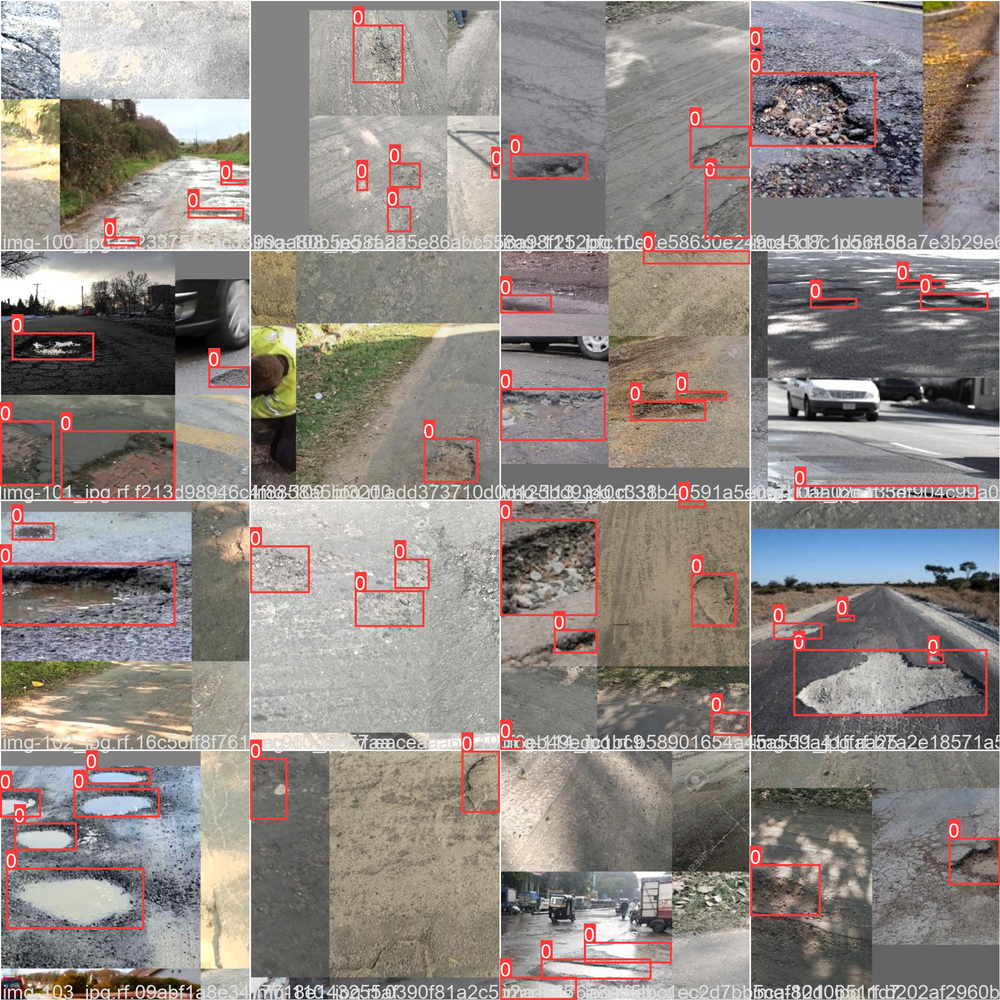

In [30]:
Image(filename='/content/yolov5/runs/train/pothole_results/train_batch0.jpg',width=1000)

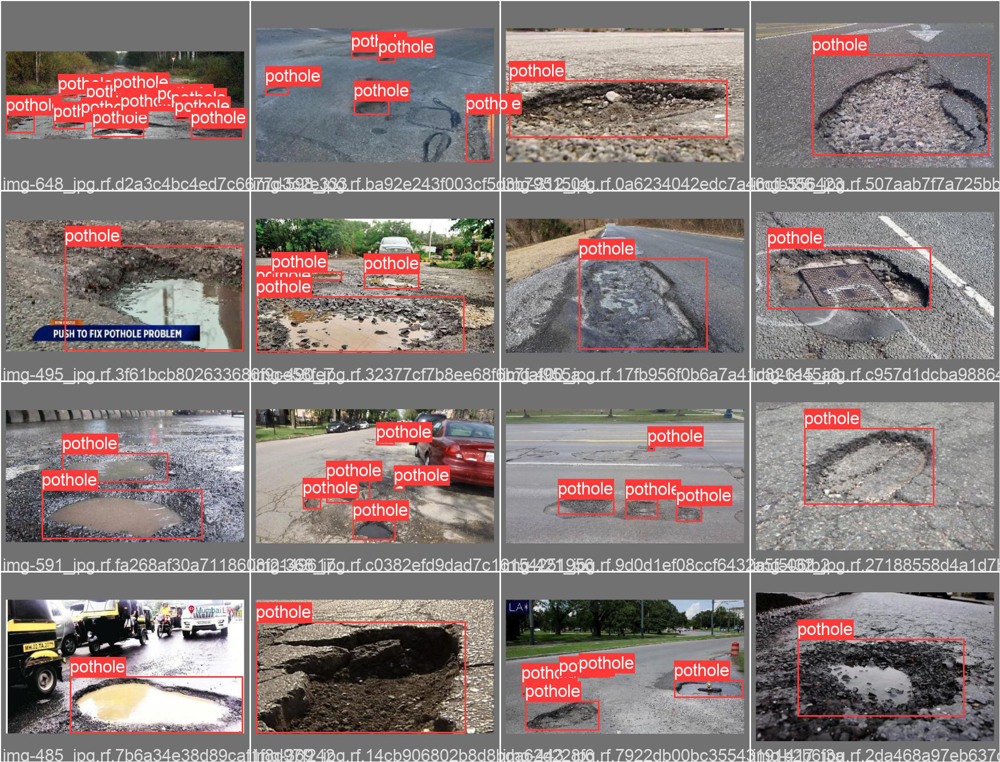

In [33]:
Image(filename='/content/yolov5/runs/train/pothole_results/val_batch0_labels.jpg',width=1000)

In [34]:
# 검증
!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --iou 0.65 --half

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning 'pothole/valid/labels.cache' images and labels... 133 found, 0 missing, 0 empty, 0 corrupted: 100% 133/133 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 5/5 [00:03<00:00,  1.36it/s]
                 all        133        330      0.708       0.53        0.6      0.277
Speed: 0.1ms pre-process, 4.8ms inference, 3.6ms NMS per image at shape (32, 3, 640, 640)
Results saved to runs/val/exp


In [35]:

!python val.py --weights runs/train/pothole_results/weights/best.pt --data ./pothole/data.yaml --img 640 --task test

val: data=./pothole/data.yaml, weights=['runs/train/pothole_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning 'pothole/test/labels' images and labels...67 found, 0 missing, 0 empty, 0 corrupted: 100% 67/67 [00:00<00:00, 2944.82it/s]
test: New cache created: pothole/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:02<00:00,  1.32it/s]
                 all         67        154      0.717      0.526      0.641      0.301
Speed: 0.2ms pre-process, 5.3ms inference, 1.5ms NMS per image at shape (32, 3, 640, 640)

In [38]:

!python detect.py --weights runs/train/pothole_results/weights/best.pt --img 640 --conf 0.4 --source ./pothole/test/images

detect: weights=['runs/train/pothole_results/weights/best.pt'], source=./pothole/test/images, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/67 /content/yolov5/pothole/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 640x640 1 pothole, Done. (0.007s)
image 2/67 /content/yolov5/pothole/test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg: 640x640 1 pothole, Done. (0.007s)
image 3/67 /content/yolov5/pothole/test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg: 640x640

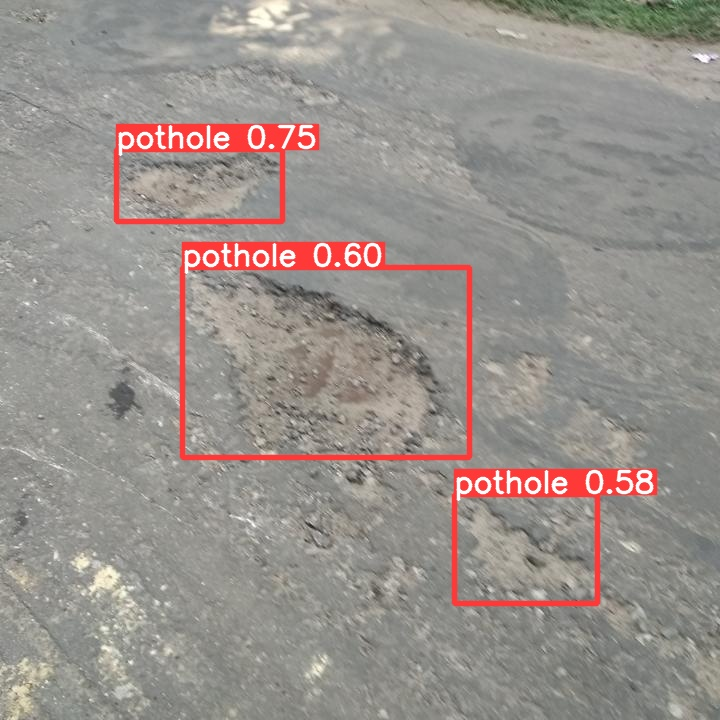

In [44]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [45]:
# 모델 내보내기
%mkdir /content/drive/MyDrive/cakd3_colab/dl_keras/pothole
%cp /content/yolov5/runs/train/pothole_results/weights/best.pt /content/drive/MyDrive/cakd3_colab/dl_keras/pothole

mkdir: cannot create directory ‘/content/drive/MyDrive/cakd3_colab/dl_keras/pothole’: File exists
